# DermNet Skin Condition Diagnosis
# EfficientNetV2-S — Training, Evaluation & Grad-CAM Auditing

**Platform:** Kaggle (P100 GPU)  
**Framework:** PyTorch + timm

| Section | Content |
|---|---|
| 1 | Environment, installs, GPU check |
| 2 | Configuration block |
| 3 | Architectural discussion — why EfficientNetV2-S |
| 4 | Class discovery & label encoding |
| 5 | Image manifests & stratified K-fold splits |
| 6 | Class weights for Focal Loss |
| 7 | Augmentation pipelines |
| 8 | Dataset & DataLoader classes |
| 9 | Augmented batch sanity check |
| 10 | Model build — EfficientNetV2-S |
| 11 | Focal Loss implementation |
| 12 | Optimiser & LR schedule |
| 13 | Training loop (two-phase fine-tuning) |
| 14 | Training curves |
| 15 | Test set inference |
| 16 | Classification report (per-class F1/P/R) |
| 17 | Top-K accuracy |
| 18 | Confusion matrices |
| 19 | Per-class accuracy analysis |
| 20 | Best & worst performing classes |
| 21 | Confidence & calibration analysis |
| 22 | Top confused class pairs |
| 23 | Grad-CAM setup |
| 24 | Correct predictions audit |
| 25 | High-confidence errors audit |
| 26 | Per-class Grad-CAM gallery |
| 27 | Centre coverage score |
| 28 | Audit summary |

---
## Section 1 · Environment Check & Installs

In [1]:
import subprocess, sys

def install(pkg):
    subprocess.check_call([sys.executable, '-m', 'pip', 'install', '-q', pkg])

install('timm>=0.9.0')
install('torchmetrics')
install('grad-cam')

import torch, torchvision, timm
print(f'PyTorch     : {torch.__version__}')
print(f'Torchvision : {torchvision.__version__}')
print(f'timm        : {timm.__version__}')
print(f'CUDA        : {torch.cuda.is_available()}')
if torch.cuda.is_available():
    print(f'GPU         : {torch.cuda.get_device_name(0)}')
    print(f'VRAM        : {torch.cuda.get_device_properties(0).total_memory/1e9:.1f} GB')

DEVICE = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print(f'\nUsing: {DEVICE}')

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.8/7.8 MB 72.5 MB/s eta 0:00:00
PyTorch     : 2.9.0+cu126
Torchvision : 0.24.0+cu126
timm        : 1.0.24
CUDA        : True
GPU         : Tesla P100-PCIE-16GB
VRAM        : 17.1 GB

Using: cuda


---
## Section 2 · Configuration
*All hyperparameters and paths in one place. Edit only this cell.*

In [2]:
import os, random, warnings
import numpy as np
warnings.filterwarnings('ignore')

# ── Paths ─────────────────────────────────────────────────────────────────────
BASE_DIR      = '/kaggle/input/datasets/joshuaaryampa/skin-conditions/dermnet'
TRAIN_DIR     = os.path.join(BASE_DIR, 'train')
TEST_DIR      = os.path.join(BASE_DIR, 'test')
OUTPUT_DIR    = '/kaggle/working/outputs'
os.makedirs(OUTPUT_DIR, exist_ok=True)

# ── Model ─────────────────────────────────────────────────────────────────────
MODEL_NAME    = 'tf_efficientnetv2_s'
IMG_SIZE      = 300
NUM_WORKERS   = 2

# ── Training ──────────────────────────────────────────────────────────────────
BATCH_SIZE    = 32
NUM_EPOCHS    = 30
WARMUP_EPOCHS = 5       # Phase 1: head-only (frozen backbone)
N_FOLDS       = 5
FOLD_TO_TRAIN = 0       # Change 0-4 to train other folds
SEED          = 42
LR_MAX        = 1e-3
WEIGHT_DECAY  = 1e-4
FOCAL_GAMMA   = 2.0
LABEL_SMOOTHING = 0.1
EARLY_STOP_PATIENCE = 7

# ── Normalisation ─────────────────────────────────────────────────────────────
IMAGENET_MEAN = [0.485, 0.456, 0.406]
IMAGENET_STD  = [0.229, 0.224, 0.225]

def seed_everything(seed):
    random.seed(seed); np.random.seed(seed)
    torch.manual_seed(seed); torch.cuda.manual_seed_all(seed)
    torch.backends.cudnn.deterministic = True
    torch.backends.cudnn.benchmark = False

seed_everything(SEED)
print('Configuration loaded.')
print(f'  Model={MODEL_NAME}  Input={IMG_SIZE}px  Batch={BATCH_SIZE}  Epochs={NUM_EPOCHS}  Fold={FOLD_TO_TRAIN}')

Configuration loaded.
  Model=tf_efficientnetv2_s  Input=300px  Batch=32  Epochs=30  Fold=0


---
## Section 3 · Architectural Discussion: Why EfficientNetV2-S?

### 3.1 Design Philosophy
EfficientNetV2 (Tan & Le, 2021) improves on the original EfficientNet in two ways: it replaces depthwise separable convolutions in early stages with **Fused-MBConv blocks** (regular 3×3 convolutions), which run 2–4× faster on modern GPUs and capture low-level spatial features more effectively; and it supports **progressive learning**, where image size and augmentation strength increase gradually during training.

### 3.2 Architecture–EDA Alignment

| EDA Finding | How EfficientNetV2-S Addresses It |
|---|---|
| Colour is discriminative (VIZ 15–17) | Fused-MBConv early blocks learn colour-sensitive spatial filters more effectively than depthwise separable convolutions. ImageNet pretraining provides colour-aware features from the start. |
| Texture is discriminative (VIZ 19–20) | 6 progressive stages with increasing depth capture texture hierarchically — from edges (Stage 1) to complex scale/papule patterns (Stage 6). |
| Image size variability (VIZ 9–11) | Native 300px input preserves more spatial detail than 224px alternatives, retaining fine lesion morphology. |
| Class imbalance (VIZ 1–5) | Compatible with Focal Loss and WeightedRandomSampler. Stochastic depth regularises minority class learning. |
| Acquisition variability (VIZ 13–14) | Batch normalisation in every block normalises activations regardless of input brightness variation. |
| Visually similar classes (VIZ 23) | 22M parameters — sufficient depth for fine-grained discrimination without overfitting at this dataset size. |
| Small dataset per class | ImageNet-pretrained weights require minimal fine-tuning data to adapt to new classes. |

### 3.3 Stage Summary

| Stage | Block Type | Filters | Layers | Output Resolution |
|---|---|---|---|---|
| Stem | Conv 3×3 | 24 | 1 | 150×150 |
| 1 | Fused-MBConv1 | 24 | 2 | 150×150 |
| 2 | Fused-MBConv4 | 48 | 4 | 75×75 |
| 3 | Fused-MBConv4 | 64 | 4 | 38×38 |
| 4 | MBConv4 (SE) | 128 | 6 | 19×19 |
| 5 | MBConv6 (SE) | 160 | 9 | 19×19 |
| 6 | MBConv6 (SE) | 256 | 15 | 10×10 |
| Head | Conv1×1 + Pool + FC | 1280 → N | — | 1×1 |

**Total: ~22M parameters.** Grad-CAM target layer: `blocks[-1][-1]` (Stage 6, last MBConv6 block — highest semantic resolution at 10×10 spatial maps).

### 3.4 Two-Phase Fine-Tuning Strategy
- **Phase 1 (Epochs 1–5):** Backbone frozen. Only the classification head trains. Warms up head weights without corrupting pretrained features.
- **Phase 2 (Epochs 6–30):** All layers unfrozen. Differential learning rates: backbone at LR/10, head at full LR. OneCycleLR schedule throughout.

---
## Section 4 · Class Discovery & Label Encoding

In [3]:
from pathlib import Path
import pandas as pd

classes = sorted([
    d for d in os.listdir(TRAIN_DIR)
    if os.path.isdir(os.path.join(TRAIN_DIR, d))
])
NUM_CLASSES  = len(classes)
class_to_idx = {c: i for i, c in enumerate(classes)}
idx_to_class = {i: c for c, i in class_to_idx.items()}

print(f'Total classes (model output nodes): {NUM_CLASSES}')
for i, c in enumerate(classes, 1):
    print(f'  {i:>2}. {c}')

Total classes (model output nodes): 23
   1. Acne and Rosacea Photos
   2. Actinic Keratosis Basal Cell Carcinoma and other Malignant Lesions
   3. Atopic Dermatitis Photos
   4. Bullous Disease Photos
   5. Cellulitis Impetigo and other Bacterial Infections
   6. Eczema Photos
   7. Exanthems and Drug Eruptions
   8. Hair Loss Photos Alopecia and other Hair Diseases
   9. Herpes HPV and other STDs Photos
  10. Light Diseases and Disorders of Pigmentation
  11. Lupus and other Connective Tissue diseases
  12. Melanoma Skin Cancer Nevi and Moles
  13. Nail Fungus and other Nail Disease
  14. Poison Ivy Photos and other Contact Dermatitis
  15. Psoriasis pictures Lichen Planus and related diseases
  16. Scabies Lyme Disease and other Infestations and Bites
  17. Seborrheic Keratoses and other Benign Tumors
  18. Systemic Disease
  19. Tinea Ringworm Candidiasis and other Fungal Infections
  20. Urticaria Hives
  21. Vascular Tumors
  22. Vasculitis Photos
  23. Warts Molluscum and other 

---
## Section 5 · Image Manifests & Stratified K-Fold Splits

In [4]:
from sklearn.model_selection import StratifiedKFold

VALID_EXTS = {'.png', '.jpg', '.jpeg', '.bmp', '.tiff'}

def build_manifest(root, class_to_idx):
    rows = []
    for cls, idx in class_to_idx.items():
        folder = os.path.join(root, cls)
        if not os.path.isdir(folder): continue
        for fname in os.listdir(folder):
            if Path(fname).suffix.lower() in VALID_EXTS:
                rows.append({'path': os.path.join(folder, fname), 'label': idx, 'class': cls})
    return pd.DataFrame(rows).sample(frac=1, random_state=SEED).reset_index(drop=True)

train_df = build_manifest(TRAIN_DIR, class_to_idx)
test_df  = build_manifest(TEST_DIR,  class_to_idx)

# Stratified K-Fold — required by EDA thin test coverage finding (VIZ 7-8)
skf = StratifiedKFold(n_splits=N_FOLDS, shuffle=True, random_state=SEED)
train_df['fold'] = -1
for fold, (_, val_idx) in enumerate(skf.split(train_df, train_df['label'])):
    train_df.loc[val_idx, 'fold'] = fold

print(f'Train: {len(train_df):,} images  |  Test: {len(test_df):,} images')
for f in range(N_FOLDS):
    print(f'  Fold {f}: train={( train_df["fold"]!=f).sum():,}  val={(train_df["fold"]==f).sum():,}')

Train: 14,894 images  |  Test: 3,409 images
  Fold 0: train=11,915  val=2,979
  Fold 1: train=11,915  val=2,979
  Fold 2: train=11,915  val=2,979
  Fold 3: train=11,915  val=2,979
  Fold 4: train=11,916  val=2,978


---
## Section 6 · Class Weights for Focal Loss
*Inverse frequency weighting — directly addresses imbalance finding from VIZ 1–5.*

In [5]:
from collections import Counter

label_counts  = Counter(train_df['label'].tolist())
total_images  = sum(label_counts.values())
class_weights = torch.tensor([
    total_images / (NUM_CLASSES * label_counts[i])
    for i in range(NUM_CLASSES)
], dtype=torch.float32).to(DEVICE)

print('Class weights (higher = more minority):')
for i, c in enumerate(classes):
    print(f'  {c:<45} {class_weights[i].item():.4f}')

Class weights (higher = more minority):
  Acne and Rosacea Photos                       0.7897
  Actinic Keratosis Basal Cell Carcinoma and other Malignant Lesions 0.5772
  Atopic Dermatitis Photos                      1.3407
  Bullous Disease Photos                        1.4785
  Cellulitis Impetigo and other Bacterial Infections 2.2963
  Eczema Photos                                 0.5573
  Exanthems and Drug Eruptions                  1.7177
  Hair Loss Photos Alopecia and other Hair Diseases 2.7912
  Herpes HPV and other STDs Photos              1.6069
  Light Diseases and Disorders of Pigmentation  1.1795
  Lupus and other Connective Tissue diseases    1.5566
  Melanoma Skin Cancer Nevi and Moles           1.4422
  Nail Fungus and other Nail Disease            0.6774
  Poison Ivy Photos and other Contact Dermatitis 2.5495
  Psoriasis pictures Lichen Planus and related diseases 0.5043
  Scabies Lyme Disease and other Infestations and Bites 1.5418
  Seborrheic Keratoses and other 

---
## Section 7 · Augmentation Pipelines
*Conservative colour jitter preserves the clinically meaningful colour signal confirmed in VIZ 15–17.*  
*No blur augmentation — texture is discriminative (VIZ 19). Pad-to-square before resize — preserves lesion aspect ratio (VIZ 10–11).*

In [6]:
import torchvision.transforms as T
import torchvision.transforms.functional as TF
from PIL import Image

class PadToSquare:
    """Pad to square with black border — preserves lesion aspect ratio (EDA VIZ 10-11)."""
    def __call__(self, img):
        w, h = img.size
        s = max(w, h)
        pw, ph = (s-w)//2, (s-h)//2
        return TF.pad(img, [pw, ph, s-w-pw, s-h-ph], fill=0)

train_transform = T.Compose([
    T.Lambda(lambda img: img.convert('RGB')),   # EDA VIZ 12: enforce RGB
    PadToSquare(),
    T.Resize((IMG_SIZE, IMG_SIZE)),
    T.RandomHorizontalFlip(p=0.5),
    T.RandomVerticalFlip(p=0.2),
    T.RandomRotation(degrees=15),
    T.ColorJitter(
        brightness=0.15,  # conservative — erythema signal (VIZ 15)
        contrast=0.15,
        saturation=0.10,  # saturation is class-discriminative (VIZ 17)
        hue=0.05,         # minimal — hue shifts destroy clinical colour
    ),
    T.RandomAffine(degrees=0, translate=(0.05, 0.05), scale=(0.95, 1.05)),
    T.ToTensor(),
    T.Normalize(mean=IMAGENET_MEAN, std=IMAGENET_STD),
])

val_transform = T.Compose([
    T.Lambda(lambda img: img.convert('RGB')),
    PadToSquare(),
    T.Resize((IMG_SIZE, IMG_SIZE)),
    T.ToTensor(),
    T.Normalize(mean=IMAGENET_MEAN, std=IMAGENET_STD),
])

print('Transforms defined.')

Transforms defined.


---
## Section 8 · Dataset & DataLoader Classes

In [7]:
from torch.utils.data import Dataset, DataLoader, WeightedRandomSampler

class SkinDataset(Dataset):
    def __init__(self, df, transform=None, return_path=False):
        self.df = df.reset_index(drop=True)
        self.transform   = transform
        self.return_path = return_path

    def __len__(self): return len(self.df)

    def __getitem__(self, idx):
        row = self.df.iloc[idx]
        img = Image.open(row['path'])
        if self.transform: img = self.transform(img)
        if self.return_path:
            return img, int(row['label']), row['path']
        return img, int(row['label'])


def get_loaders(train_df, fold, batch_size, num_workers):
    fold_train = train_df[train_df['fold'] != fold].reset_index(drop=True)
    fold_val   = train_df[train_df['fold'] == fold].reset_index(drop=True)
    train_ds   = SkinDataset(fold_train, train_transform)
    val_ds     = SkinDataset(fold_val,   val_transform)
    sample_weights = [class_weights[l].item() for l in fold_train['label']]
    sampler = WeightedRandomSampler(sample_weights, len(fold_train), replacement=True)
    train_loader = DataLoader(train_ds, batch_size=batch_size, sampler=sampler,
                              num_workers=num_workers, pin_memory=True, drop_last=True)
    val_loader   = DataLoader(val_ds, batch_size=batch_size*2, shuffle=False,
                              num_workers=num_workers, pin_memory=True)
    return train_loader, val_loader


def get_test_loader(test_df, batch_size, num_workers, return_path=False):
    ds = SkinDataset(test_df, val_transform, return_path=return_path)
    return DataLoader(ds, batch_size=batch_size*2, shuffle=False,
                      num_workers=num_workers, pin_memory=True)

print('Dataset and DataLoader classes defined.')

Dataset and DataLoader classes defined.


---
## Section 9 · Augmented Batch Sanity Check
*Visually verify that augmented images remain clinically plausible before training.*

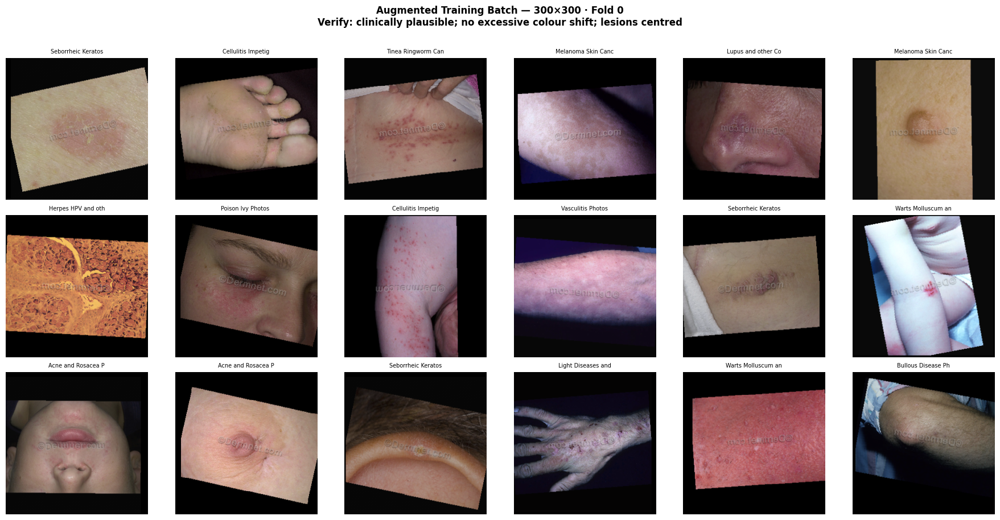

Batch shape: torch.Size([32, 3, 300, 300])
Train batches: 372  |  Val batches: 47


In [8]:
import matplotlib.pyplot as plt
%matplotlib inline
plt.rcParams.update({'axes.spines.top': False, 'axes.spines.right': False})

train_loader, val_loader = get_loaders(train_df, FOLD_TO_TRAIN, BATCH_SIZE, NUM_WORKERS)
imgs, labels = next(iter(train_loader))

def denorm(tensor):
    mean = torch.tensor(IMAGENET_MEAN).view(3,1,1)
    std  = torch.tensor(IMAGENET_STD).view(3,1,1)
    return torch.clamp(tensor * std + mean, 0, 1).permute(1,2,0).numpy()

fig, axes = plt.subplots(3, 6, figsize=(18, 9))
for i, ax in enumerate(axes.flat):
    if i >= len(imgs): break
    ax.imshow(denorm(imgs[i]))
    ax.set_title(idx_to_class[labels[i].item()][:18], fontsize=7)
    ax.axis('off')
plt.suptitle(f'Augmented Training Batch — {IMG_SIZE}×{IMG_SIZE} · Fold {FOLD_TO_TRAIN}\n'
             'Verify: clinically plausible; no excessive colour shift; lesions centred',
             fontweight='bold', y=1.01)
plt.tight_layout()
plt.savefig(os.path.join(OUTPUT_DIR, 'augmented_batch_preview.png'), dpi=120, bbox_inches='tight')
plt.show()
print(f'Batch shape: {imgs.shape}')
print(f'Train batches: {len(train_loader)}  |  Val batches: {len(val_loader)}')

---
## Section 10 · Model Build — EfficientNetV2-S

In [9]:
def build_model(num_classes, pretrained=True):
    return timm.create_model(
        MODEL_NAME,
        pretrained     = pretrained,
        num_classes    = num_classes,
        drop_rate      = 0.3,    # classifier dropout
        drop_path_rate = 0.2,    # stochastic depth
    )

model = build_model(NUM_CLASSES).to(DEVICE)

total     = sum(p.numel() for p in model.parameters())
trainable = sum(p.numel() for p in model.parameters() if p.requires_grad)
print(f'Model         : {MODEL_NAME}')
print(f'Total params  : {total:,}')
print(f'Trainable     : {trainable:,}')
print(f'Classifier    : {model.classifier}')

model.safetensors:   0%|          | 0.00/86.5M [00:00<?, ?B/s]

Model         : tf_efficientnetv2_s
Total params  : 20,206,951
Trainable     : 20,206,951
Classifier    : Linear(in_features=1280, out_features=23, bias=True)


---
## Section 11 · Focal Loss
*Down-weights easy majority-class examples; focuses gradient on hard minority-class examples. Directly addresses VIZ 1–5 imbalance finding.*

In [10]:
import torch.nn as nn

class FocalLoss(nn.Module):
    """
    Focal Loss = -alpha_t * (1 - p_t)^gamma * log(p_t)
    gamma=0  → standard weighted CrossEntropy
    gamma=2  → 4x less weight on well-classified (easy) examples
    """
    def __init__(self, alpha, gamma=2.0, label_smoothing=0.1):
        super().__init__()
        self.alpha           = alpha
        self.gamma           = gamma
        self.label_smoothing = label_smoothing

    def forward(self, logits, targets):
        ce   = nn.functional.cross_entropy(
            logits, targets,
            weight=self.alpha,
            label_smoothing=self.label_smoothing,
            reduction='none'
        )
        pt   = torch.exp(-ce)
        return (((1 - pt) ** self.gamma) * ce).mean()

criterion = FocalLoss(alpha=class_weights, gamma=FOCAL_GAMMA, label_smoothing=LABEL_SMOOTHING)
print(f'Focal Loss: gamma={FOCAL_GAMMA}, label_smoothing={LABEL_SMOOTHING}')
print(f'Weight range: {class_weights.min().item():.4f} – {class_weights.max().item():.4f}')

Focal Loss: gamma=2.0, label_smoothing=0.1
Weight range: 0.4804 – 3.1133


---
## Section 12 · Optimiser & Learning Rate Schedule

In [11]:
import torch.optim as optim

def freeze_backbone(model):
    for name, p in model.named_parameters():
        if 'classifier' not in name: p.requires_grad = False
    t = sum(p.numel() for p in model.parameters() if p.requires_grad)
    print(f'Backbone frozen  — trainable: {t:,} (head only)')

def unfreeze_all(model):
    for p in model.parameters(): p.requires_grad = True
    t = sum(p.numel() for p in model.parameters() if p.requires_grad)
    print(f'All layers unfrozen — trainable: {t:,}')

def make_optimizer_scheduler(model, phase, steps_per_epoch, n_epochs):
    if phase == 1:
        opt = optim.AdamW(
            filter(lambda p: p.requires_grad, model.parameters()),
            lr=LR_MAX, weight_decay=WEIGHT_DECAY
        )
        sch = optim.lr_scheduler.OneCycleLR(
            opt, max_lr=LR_MAX, steps_per_epoch=steps_per_epoch,
            epochs=n_epochs, pct_start=0.3, anneal_strategy='cos'
        )
    else:
        head_p     = [p for n,p in model.named_parameters() if 'classifier' in n]
        backbone_p = [p for n,p in model.named_parameters() if 'classifier' not in n]
        opt = optim.AdamW([
            {'params': backbone_p, 'lr': LR_MAX/10},
            {'params': head_p,     'lr': LR_MAX},
        ], weight_decay=WEIGHT_DECAY)
        sch = optim.lr_scheduler.OneCycleLR(
            opt, max_lr=[LR_MAX/10, LR_MAX],
            steps_per_epoch=steps_per_epoch,
            epochs=n_epochs, pct_start=0.2, anneal_strategy='cos'
        )
    return opt, sch

print('Optimiser and scheduler functions defined.')

Optimiser and scheduler functions defined.


---
## Section 13 · Training Loop (Two-Phase Fine-Tuning)

In [12]:
import time
from torch.cuda.amp import GradScaler, autocast

scaler = GradScaler()

def train_epoch(model, loader, optimizer, scheduler, criterion, epoch):
    model.train()
    loss_sum = correct = total = 0
    t0 = time.time()
    for i, (imgs, labels) in enumerate(loader):
        imgs, labels = imgs.to(DEVICE, non_blocking=True), labels.to(DEVICE, non_blocking=True)
        optimizer.zero_grad(set_to_none=True)
        with autocast():
            logits = model(imgs)
            loss   = criterion(logits, labels)
        scaler.scale(loss).backward()
        scaler.unscale_(optimizer)
        nn.utils.clip_grad_norm_(model.parameters(), 1.0)
        scaler.step(optimizer); scaler.update()
        scheduler.step()
        loss_sum += loss.item() * imgs.size(0)
        correct  += (logits.argmax(1) == labels).sum().item()
        total    += imgs.size(0)
        if (i+1) % 50 == 0:
            print(f'  [{epoch}|{i+1}/{len(loader)}] loss={loss_sum/total:.4f} '
                  f'acc={correct/total:.4f} lr={scheduler.get_last_lr()[0]:.2e}')
    return loss_sum/total, correct/total, time.time()-t0

@torch.no_grad()
def validate(model, loader, criterion):
    model.eval()
    loss_sum = correct = total = 0
    for imgs, labels in loader:
        imgs, labels = imgs.to(DEVICE, non_blocking=True), labels.to(DEVICE, non_blocking=True)
        with autocast():
            logits = model(imgs)
            loss   = criterion(logits, labels)
        loss_sum += loss.item() * imgs.size(0)
        correct  += (logits.argmax(1) == labels).sum().item()
        total    += imgs.size(0)
    return loss_sum/total, correct/total

# ── Training state ────────────────────────────────────────────────────────────
history   = {'train_loss':[], 'val_loss':[], 'train_acc':[], 'val_acc':[], 'lr':[]}
best_acc  = 0.0
patience  = 0
best_ckpt = os.path.join(OUTPUT_DIR, f'best_model_fold{FOLD_TO_TRAIN}.pth')

# ── PHASE 1: Head warmup ──────────────────────────────────────────────────────
print('='*60)
print(f'PHASE 1 — Head Warmup (Epochs 1–{WARMUP_EPOCHS}, backbone frozen)')
print('='*60)
freeze_backbone(model)
opt, sch = make_optimizer_scheduler(model, 1, len(train_loader), WARMUP_EPOCHS)

for epoch in range(1, WARMUP_EPOCHS+1):
    tl, ta, dt = train_epoch(model, train_loader, opt, sch, criterion, epoch)
    vl, va     = validate(model, val_loader, criterion)
    history['train_loss'].append(tl); history['val_loss'].append(vl)
    history['train_acc'].append(ta);  history['val_acc'].append(va)
    history['lr'].append(sch.get_last_lr()[0])
    print(f'Epoch {epoch:>3}/{NUM_EPOCHS} | TrL={tl:.4f} TrA={ta:.4f} | VlL={vl:.4f} VlA={va:.4f} | {dt:.0f}s')

# ── PHASE 2: Full fine-tuning ─────────────────────────────────────────────────
print('\n' + '='*60)
print(f'PHASE 2 — Full Fine-tuning (Epochs {WARMUP_EPOCHS+1}–{NUM_EPOCHS})')
print('='*60)
unfreeze_all(model)
phase2_epochs = NUM_EPOCHS - WARMUP_EPOCHS
opt, sch = make_optimizer_scheduler(model, 2, len(train_loader), phase2_epochs)

for epoch in range(WARMUP_EPOCHS+1, NUM_EPOCHS+1):
    tl, ta, dt = train_epoch(model, train_loader, opt, sch, criterion, epoch)
    vl, va     = validate(model, val_loader, criterion)
    history['train_loss'].append(tl); history['val_loss'].append(vl)
    history['train_acc'].append(ta);  history['val_acc'].append(va)
    history['lr'].append(sch.get_last_lr()[0])
    print(f'Epoch {epoch:>3}/{NUM_EPOCHS} | TrL={tl:.4f} TrA={ta:.4f} | VlL={vl:.4f} VlA={va:.4f} | {dt:.0f}s', end='')
    if va > best_acc:
        best_acc = va; patience = 0
        torch.save({'epoch': epoch, 'model_state': model.state_dict(),
                    'val_acc': va, 'val_loss': vl, 'history': history,
                    'classes': classes, 'NUM_CLASSES': NUM_CLASSES}, best_ckpt)
        print(f'  ✓ checkpoint saved (val_acc={va:.4f})')
    else:
        patience += 1
        print(f'  (patience {patience}/{EARLY_STOP_PATIENCE})')
    if patience >= EARLY_STOP_PATIENCE:
        print(f'Early stopping at epoch {epoch}.'); break

print(f'\nTraining complete. Best val accuracy: {best_acc:.4f}')

PHASE 1 — Head Warmup (Epochs 1–5, backbone frozen)
Backbone frozen  — trainable: 29,463 (head only)
  [1|50/372] loss=10.1007 acc=0.0437 lr=5.90e-05
  [1|100/372] loss=9.9833 acc=0.0459 lr=1.14e-04
  [1|150/372] loss=9.6922 acc=0.0467 lr=2.02e-04
  [1|200/372] loss=9.5127 acc=0.0448 lr=3.14e-04
  [1|250/372] loss=9.2775 acc=0.0450 lr=4.43e-04
  [1|300/372] loss=9.0664 acc=0.0471 lr=5.78e-04
  [1|350/372] loss=8.8433 acc=0.0493 lr=7.08e-04
Epoch   1/30 | TrL=8.7434 TrA=0.0513 | VlL=4.4552 VlA=0.0869 | 131s
  [2|50/372] loss=7.2153 acc=0.0881 lr=8.67e-04
  [2|100/372] loss=6.9370 acc=0.0988 lr=9.46e-04
  [2|150/372] loss=6.8074 acc=0.1000 lr=9.91e-04
  [2|200/372] loss=6.7050 acc=0.1023 lr=1.00e-03
  [2|250/372] loss=6.5777 acc=0.1092 lr=9.94e-04
  [2|300/372] loss=6.4718 acc=0.1122 lr=9.81e-04
  [2|350/372] loss=6.3719 acc=0.1180 lr=9.61e-04
Epoch   2/30 | TrL=6.3332 TrA=0.1191 | VlL=3.4399 VlA=0.1742 | 120s
  [3|50/372] loss=5.4310 acc=0.1562 lr=9.20e-04
  [3|100/372] loss=5.3457 acc=

---
## Section 14 · Training Curves

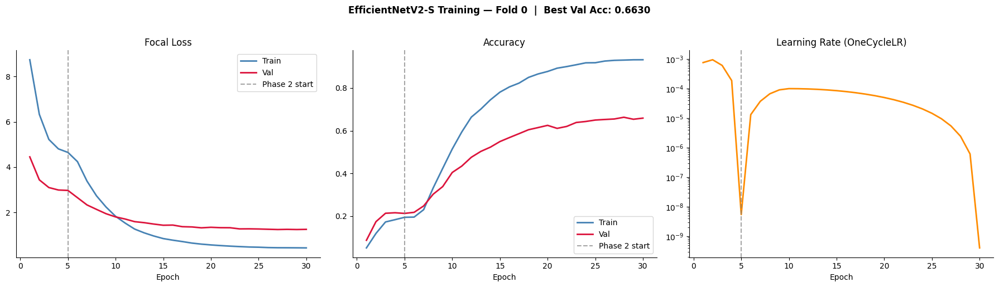

In [13]:
ep = range(1, len(history['train_loss'])+1)
fig, axes = plt.subplots(1, 3, figsize=(18, 5))

axes[0].plot(ep, history['train_loss'], color='steelblue', lw=2, label='Train')
axes[0].plot(ep, history['val_loss'],   color='crimson',   lw=2, label='Val')
axes[0].axvline(WARMUP_EPOCHS, color='grey', ls='--', alpha=0.7, label='Phase 2 start')
axes[0].set_title('Focal Loss'); axes[0].set_xlabel('Epoch'); axes[0].legend()

axes[1].plot(ep, history['train_acc'], color='steelblue', lw=2, label='Train')
axes[1].plot(ep, history['val_acc'],   color='crimson',   lw=2, label='Val')
axes[1].axvline(WARMUP_EPOCHS, color='grey', ls='--', alpha=0.7, label='Phase 2 start')
axes[1].set_title('Accuracy'); axes[1].set_xlabel('Epoch'); axes[1].legend()

axes[2].plot(ep, history['lr'], color='darkorange', lw=2)
axes[2].axvline(WARMUP_EPOCHS, color='grey', ls='--', alpha=0.7)
axes[2].set_title('Learning Rate (OneCycleLR)'); axes[2].set_xlabel('Epoch')
axes[2].set_yscale('log')

plt.suptitle(f'EfficientNetV2-S Training — Fold {FOLD_TO_TRAIN}  |  Best Val Acc: {best_acc:.4f}',
             fontweight='bold', y=1.02)
plt.tight_layout()
plt.savefig(os.path.join(OUTPUT_DIR, f'training_curves_fold{FOLD_TO_TRAIN}.png'), dpi=120, bbox_inches='tight')
plt.show()

---
## Section 15 · Load Best Checkpoint & Test Set Inference

In [14]:
import torch.nn.functional as F

checkpoint = torch.load(best_ckpt, map_location=DEVICE)
model.load_state_dict(checkpoint['model_state'])
model.eval()
print(f'Best checkpoint loaded — epoch {checkpoint["epoch"]}  val_acc={checkpoint["val_acc"]:.4f}')

# Build test loader with path return for Grad-CAM later
test_ds_paths = SkinDataset(test_df, val_transform, return_path=True)
test_loader_paths = DataLoader(test_ds_paths, batch_size=BATCH_SIZE*2, shuffle=False,
                                num_workers=NUM_WORKERS, pin_memory=True)

all_preds, all_labels, all_probs, all_paths = [], [], [], []

with torch.no_grad():
    for imgs, labels, paths in test_loader_paths:
        imgs = imgs.to(DEVICE, non_blocking=True)
        with autocast():
            logits = model(imgs)
        probs = F.softmax(logits, dim=1).cpu().numpy()
        all_probs.extend(probs)
        all_preds.extend(probs.argmax(axis=1))
        all_labels.extend(labels.numpy())
        all_paths.extend(paths)

all_preds     = np.array(all_preds)
all_labels    = np.array(all_labels)
all_probs     = np.array(all_probs)
all_probs_max = all_probs.max(axis=1)
correct_mask  = (all_preds == all_labels)

overall_acc = correct_mask.mean()
print(f'Test images      : {len(all_labels):,}')
print(f'Overall accuracy : {overall_acc:.4f}  ({overall_acc*100:.2f}%)')

Best checkpoint loaded — epoch 28  val_acc=0.6630
Test images      : 3,409
Overall accuracy : 0.6489  (64.89%)


---
## Section 16 · Classification Report
*Per-class precision, recall, F1 — the only meaningful metrics for an imbalanced medical dataset.*

In [15]:
from sklearn.metrics import classification_report, confusion_matrix, top_k_accuracy_score

report_str  = classification_report(all_labels, all_preds, target_names=classes, digits=4)
report_dict = classification_report(all_labels, all_preds, target_names=classes, digits=4, output_dict=True)

print('CLASSIFICATION REPORT')
print('='*70)
print(report_str)

with open(os.path.join(OUTPUT_DIR, 'classification_report.txt'), 'w') as f:
    f.write(report_str)

CLASSIFICATION REPORT
                                                                    precision    recall  f1-score   support

                                           Acne and Rosacea Photos     0.3478    0.7619    0.4776        42
Actinic Keratosis Basal Cell Carcinoma and other Malignant Lesions     0.8029    0.6162    0.6973       271
                                          Atopic Dermatitis Photos     0.6331    0.7333    0.6795       120
                                            Bullous Disease Photos     0.5040    0.5943    0.5455       106
                Cellulitis Impetigo and other Bacterial Infections     0.5000    0.4928    0.4964        69
                                                     Eczema Photos     0.6652    0.5885    0.6245       260
                                      Exanthems and Drug Eruptions     0.5179    0.6374    0.5714        91
                 Hair Loss Photos Alopecia and other Hair Diseases     0.5714    0.8889    0.6957        45
     

---
## Section 17 · Top-K Accuracy

In [16]:
for k in [1, 3, 5]:
    acc = top_k_accuracy_score(all_labels, all_probs, k=k, labels=list(range(NUM_CLASSES)))
    print(f'Top-{k} Accuracy: {acc:.4f}  ({acc*100:.2f}%)')

print('\nTop-3/5 reflect a clinical triage scenario: correct class in model top-N suggestions.')

Top-1 Accuracy: 0.6492  (64.92%)
Top-3 Accuracy: 0.8287  (82.87%)
Top-5 Accuracy: 0.8789  (87.89%)

Top-3/5 reflect a clinical triage scenario: correct class in model top-N suggestions.


---
## Section 18 · Confusion Matrices

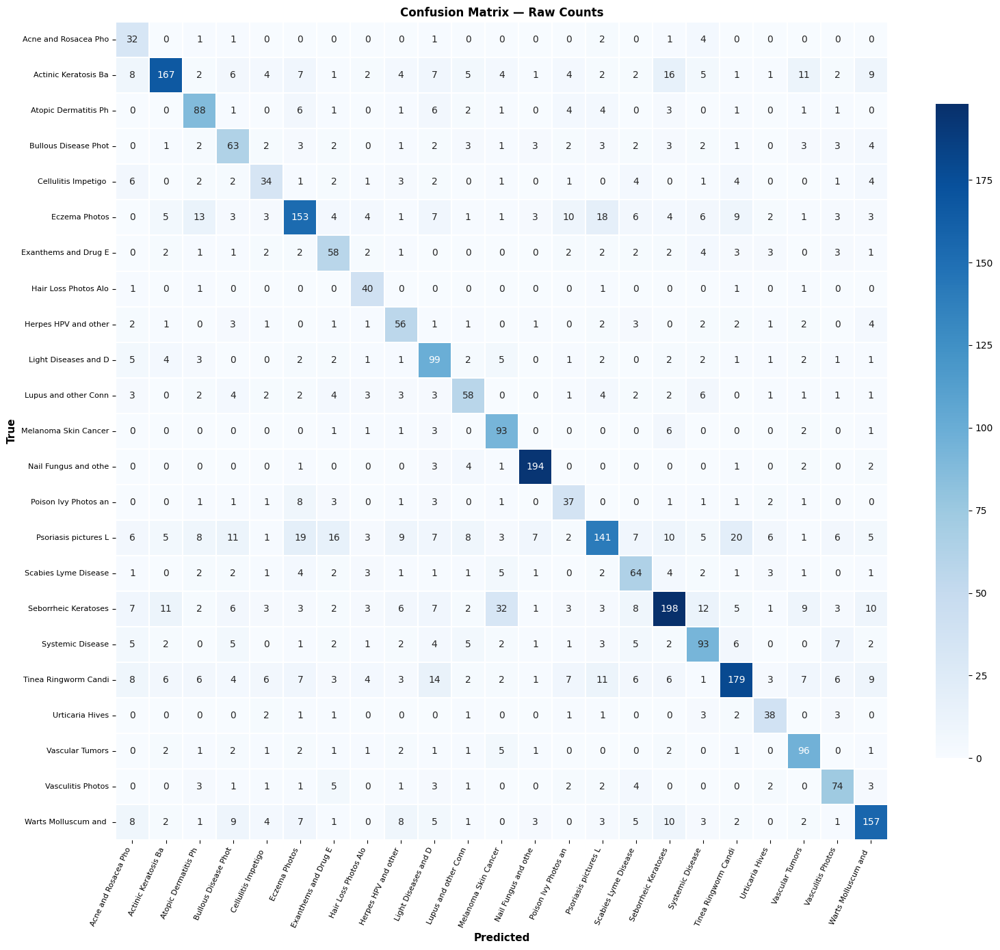

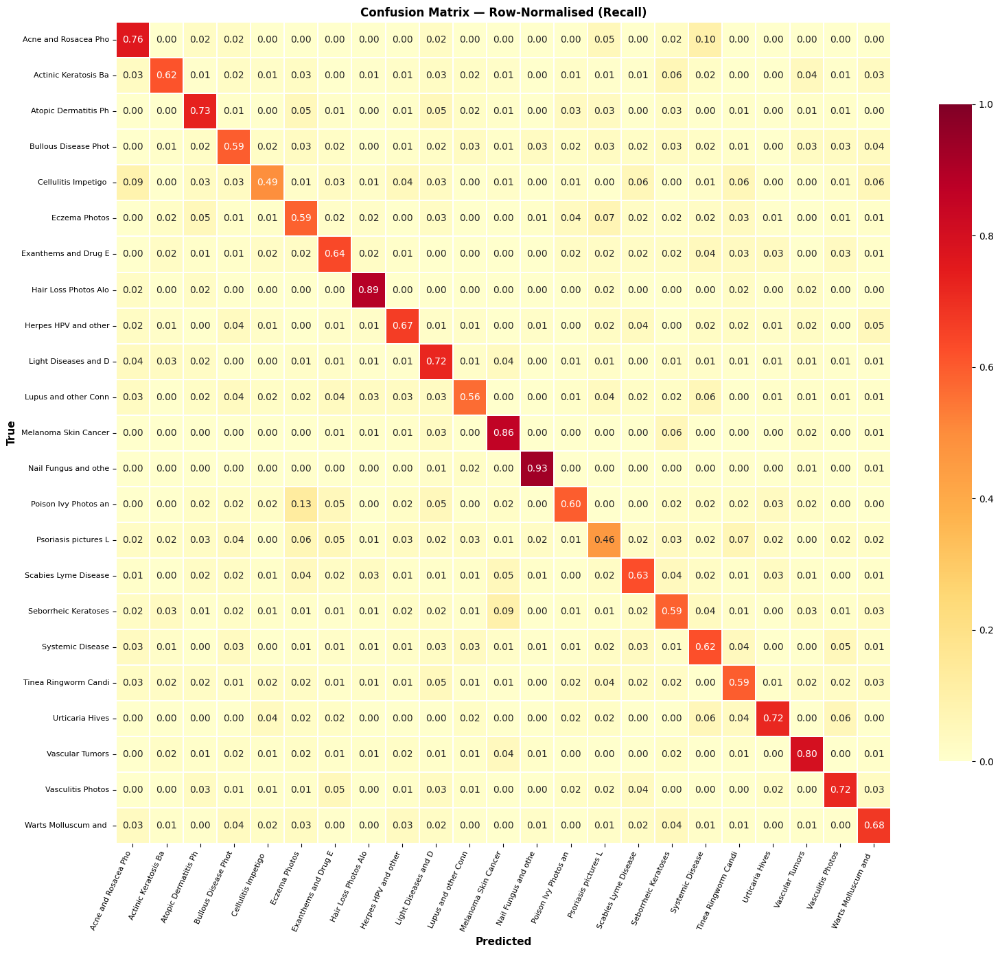

In [17]:
import seaborn as sns

cm       = confusion_matrix(all_labels, all_preds)
cm_norm  = cm.astype(float) / cm.sum(axis=1, keepdims=True)
short    = [c[:20] for c in classes]

for title, data, fmt, cmap in [
    ('Raw Counts',              cm,      'd',    'Blues'),
    ('Row-Normalised (Recall)', cm_norm, '.2f',  'YlOrRd')
]:
    fig, ax = plt.subplots(figsize=(16, 14))
    sns.heatmap(data, annot=True, fmt=fmt, cmap=cmap,
                xticklabels=short, yticklabels=short,
                linewidths=0.3, ax=ax, cbar_kws={'shrink':0.8},
                vmin=0, vmax=(1 if fmt=='.2f' else None))
    ax.set_xlabel('Predicted', fontsize=11, fontweight='bold')
    ax.set_ylabel('True',      fontsize=11, fontweight='bold')
    ax.set_title(f'Confusion Matrix — {title}', fontweight='bold')
    plt.xticks(rotation=65, ha='right', fontsize=8)
    plt.yticks(fontsize=8)
    plt.tight_layout()
    fname = 'cm_raw.png' if fmt=='d' else 'cm_normalised.png'
    plt.savefig(os.path.join(OUTPUT_DIR, fname), dpi=120, bbox_inches='tight')
    plt.show()

---
## Section 19 · Per-class Accuracy Analysis

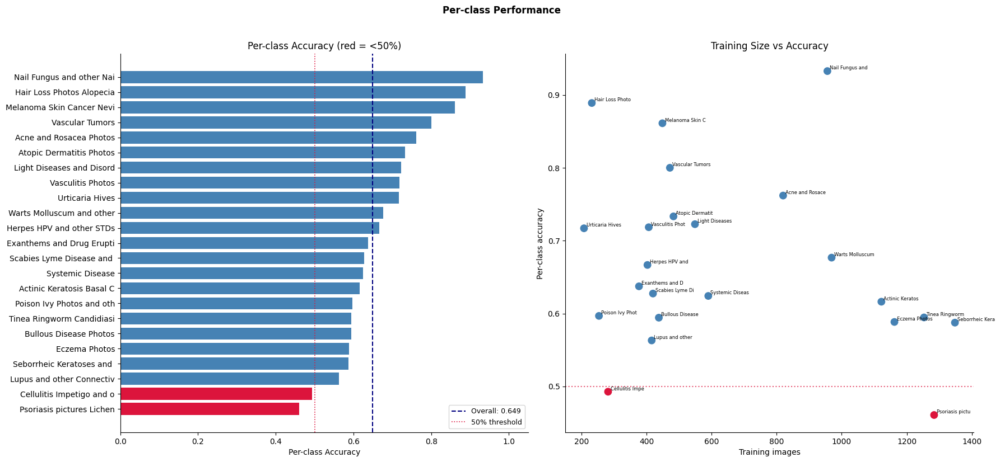

In [18]:
per_class_acc = cm_norm.diagonal()
train_counts  = train_df.groupby('label').size().reindex(range(NUM_CLASSES)).values
sorted_idx    = np.argsort(per_class_acc)

fig, axes = plt.subplots(1, 2, figsize=(18, max(6, NUM_CLASSES*0.35)))

colors = ['crimson' if per_class_acc[i]<0.5 else 'steelblue' for i in sorted_idx]
axes[0].barh([classes[i][:25] for i in sorted_idx], per_class_acc[sorted_idx], color=colors)
axes[0].axvline(overall_acc, color='navy', ls='--', lw=1.5, label=f'Overall: {overall_acc:.3f}')
axes[0].axvline(0.5, color='crimson', ls=':', lw=1.2, label='50% threshold')
axes[0].set_xlabel('Per-class Accuracy'); axes[0].legend(fontsize=9)
axes[0].set_title('Per-class Accuracy (red = <50%)')
axes[0].set_xlim(0, 1.05)

axes[1].scatter(train_counts, per_class_acc,
               c=['crimson' if a<0.5 else 'steelblue' for a in per_class_acc], s=80, zorder=3)
for i, cls in enumerate(classes):
    axes[1].annotate(cls[:15], (train_counts[i], per_class_acc[i]), fontsize=6, xytext=(3,2), textcoords='offset points')
axes[1].axhline(0.5, color='crimson', ls=':', alpha=0.7)
axes[1].set_xlabel('Training images'); axes[1].set_ylabel('Per-class accuracy')
axes[1].set_title('Training Size vs Accuracy')

plt.suptitle('Per-class Performance', fontweight='bold', y=1.02)
plt.tight_layout()
plt.savefig(os.path.join(OUTPUT_DIR, 'per_class_accuracy.png'), dpi=120, bbox_inches='tight')
plt.show()

---
## Section 20 · Best & Worst Performing Classes

In [19]:
metrics_df = pd.DataFrame({
    'Class':     classes,
    'Accuracy':  per_class_acc,
    'F1':        [report_dict[c]['f1-score']    for c in classes],
    'Precision': [report_dict[c]['precision']   for c in classes],
    'Recall':    [report_dict[c]['recall']       for c in classes],
    'Support':   [int(report_dict[c]['support']) for c in classes],
    'Train_N':   train_counts,
}).sort_values('F1', ascending=False)

print('TOP 5 BEST PERFORMING')
print(metrics_df.head(5).to_string(index=False, float_format='{:.4f}'.format))
print('\nBOTTOM 5 WORST PERFORMING')
print(metrics_df.tail(5).to_string(index=False, float_format='{:.4f}'.format))

metrics_df.to_csv(os.path.join(OUTPUT_DIR, 'per_class_metrics.csv'), index=False)

print('\nDIAGNOSIS GUIDE:')
print('  Low F1 + low Train_N  → data scarcity; consider oversampling')
print('  Low F1 + adequate N   → visual similarity; check confusion matrix')
print('  Cross-reference with EDA VIZ 20 (texture/redness scatter) and VIZ 23 (cross-class grid)')

TOP 5 BEST PERFORMING
                                                             Class  Accuracy     F1  Precision  Recall  Support  Train_N
                                Nail Fungus and other Nail Disease    0.9327 0.9129     0.8940  0.9327      208      956
                                                   Vascular Tumors    0.8000 0.7300     0.6713  0.8000      120      472
                               Melanoma Skin Cancer Nevi and Moles    0.8611 0.7019     0.5924  0.8611      108      449
                        Warts Molluscum and other Viral Infections    0.6767 0.6978     0.7202  0.6767      232      969
Actinic Keratosis Basal Cell Carcinoma and other Malignant Lesions    0.6162 0.6973     0.8029  0.6162      271     1122

BOTTOM 5 WORST PERFORMING
                                                Class  Accuracy     F1  Precision  Recall  Support  Train_N
Psoriasis pictures Lichen Planus and related diseases    0.4608 0.5508     0.6845  0.4608      306     1284
         

---
## Section 21 · Confidence & Calibration Analysis

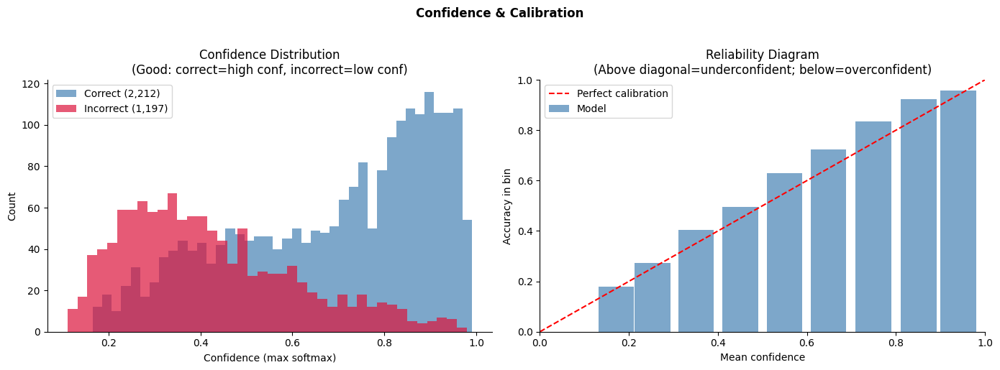

Mean confidence — correct: 0.6895 | incorrect: 0.4199


In [20]:
fig, axes = plt.subplots(1, 2, figsize=(14, 5))

axes[0].hist(all_probs_max[correct_mask],  bins=40, alpha=0.7, color='steelblue', label=f'Correct ({correct_mask.sum():,})')
axes[0].hist(all_probs_max[~correct_mask], bins=40, alpha=0.7, color='crimson',   label=f'Incorrect ({(~correct_mask).sum():,})')
axes[0].set_xlabel('Confidence (max softmax)'); axes[0].set_ylabel('Count')
axes[0].set_title('Confidence Distribution\n(Good: correct=high conf, incorrect=low conf)')
axes[0].legend()

bins = np.linspace(0, 1, 11)
bin_accs, bin_confs = [], []
for lo, hi in zip(bins[:-1], bins[1:]):
    mask = (all_probs_max >= lo) & (all_probs_max < hi)
    if mask.sum() > 0:
        bin_accs.append(correct_mask[mask].mean())
        bin_confs.append(all_probs_max[mask].mean())

axes[1].bar(bin_confs, bin_accs, width=0.08, alpha=0.7, color='steelblue', label='Model')
axes[1].plot([0,1],[0,1],'r--', lw=1.5, label='Perfect calibration')
axes[1].set_xlabel('Mean confidence'); axes[1].set_ylabel('Accuracy in bin')
axes[1].set_title('Reliability Diagram\n(Above diagonal=underconfident; below=overconfident)')
axes[1].legend(); axes[1].set_xlim(0,1); axes[1].set_ylim(0,1)

plt.suptitle('Confidence & Calibration', fontweight='bold', y=1.02)
plt.tight_layout()
plt.savefig(os.path.join(OUTPUT_DIR, 'confidence_calibration.png'), dpi=120, bbox_inches='tight')
plt.show()
print(f'Mean confidence — correct: {all_probs_max[correct_mask].mean():.4f} | incorrect: {all_probs_max[~correct_mask].mean():.4f}')

---
## Section 22 · Top Confused Class Pairs

In [21]:
cm_off = cm.copy(); np.fill_diagonal(cm_off, 0)
flat   = np.argsort(cm_off.ravel())[::-1][:15]
ri, ci = np.unravel_index(flat, cm.shape)

confused_df = pd.DataFrame({
    'True Class':    [classes[r] for r in ri],
    'Predicted As':  [classes[c] for c in ci],
    'Count':         [cm_off[r,c] for r,c in zip(ri,ci)],
    'Recall Impact': [f'{cm_off[r,c]/cm[r,:].sum()*100:.1f}%' for r,c in zip(ri,ci)],
})

print('TOP 15 MOST CONFUSED PAIRS')
print('='*70)
print(confused_df.to_string(index=False))
print('\nCross-reference with EDA VIZ 20. Pairs clustering in texture/redness space should appear here.')
confused_df.to_csv(os.path.join(OUTPUT_DIR, 'confused_pairs.csv'), index=False)

TOP 15 MOST CONFUSED PAIRS
                                                        True Class                                                       Predicted As  Count Recall Impact
                      Seborrheic Keratoses and other Benign Tumors                                Melanoma Skin Cancer Nevi and Moles     32          9.5%
             Psoriasis pictures Lichen Planus and related diseases             Tinea Ringworm Candidiasis and other Fungal Infections     20          6.5%
             Psoriasis pictures Lichen Planus and related diseases                                                      Eczema Photos     19          6.2%
                                                     Eczema Photos              Psoriasis pictures Lichen Planus and related diseases     18          6.9%
Actinic Keratosis Basal Cell Carcinoma and other Malignant Lesions                       Seborrheic Keratoses and other Benign Tumors     16          5.9%
             Psoriasis pictures Lichen Plan

---
## Section 23 · Grad-CAM Setup

**Why Grad-CAM for skin condition diagnosis?**  
Grad-CAM is a clinical safety check. A model can achieve high accuracy while attending to the wrong regions — image borders, hair, rulers, or colour calibration cards rather than the lesion itself (acquisition artefacts flagged in EDA VIZ 13–14). Grad-CAM verifies the model is attending to the **lesion morphology**.

**Target layer:** `model.blocks[-1][-1]` — the last MBConv6 block in Stage 6. This produces 10×10 spatial activation maps at the highest semantic level, giving the best localisation of lesion-relevant features.

In [23]:
import cv2
from pytorch_grad_cam import GradCAM
from pytorch_grad_cam.utils.image import show_cam_on_image
from pytorch_grad_cam.utils.model_targets import ClassifierOutputTarget

target_layer = [model.blocks[-1][-1]]

# use_cuda argument was removed in grad-cam >= 1.4
# the library now infers the device automatically from the model
grad_cam = GradCAM(model=model, target_layers=target_layer)

def get_cam(img_path, class_idx):
    """Return (overlay, cam_map, rgb_img) for a given image and target class."""
    pil  = Image.open(img_path)
    t    = val_transform(pil).unsqueeze(0).to(DEVICE)
    cam  = grad_cam(input_tensor=t, targets=[ClassifierOutputTarget(class_idx)])[0]
    mean = torch.tensor(IMAGENET_MEAN).view(3,1,1)
    std  = torch.tensor(IMAGENET_STD).view(3,1,1)
    rgb  = torch.clamp(t.squeeze(0).cpu()*std+mean, 0, 1).permute(1,2,0).numpy()
    overlay = show_cam_on_image(rgb.astype(np.float32), cam, use_rgb=True)
    return overlay, cam, rgb

print(f'Grad-CAM ready. Target: {type(target_layer[0]).__name__} (Stage 6, last MBConv6)')

Grad-CAM ready. Target: InvertedResidual (Stage 6, last MBConv6)


---
## Section 24 · Correct Predictions Audit
*Verify the model attends to the lesion, not to background or acquisition artefacts.*

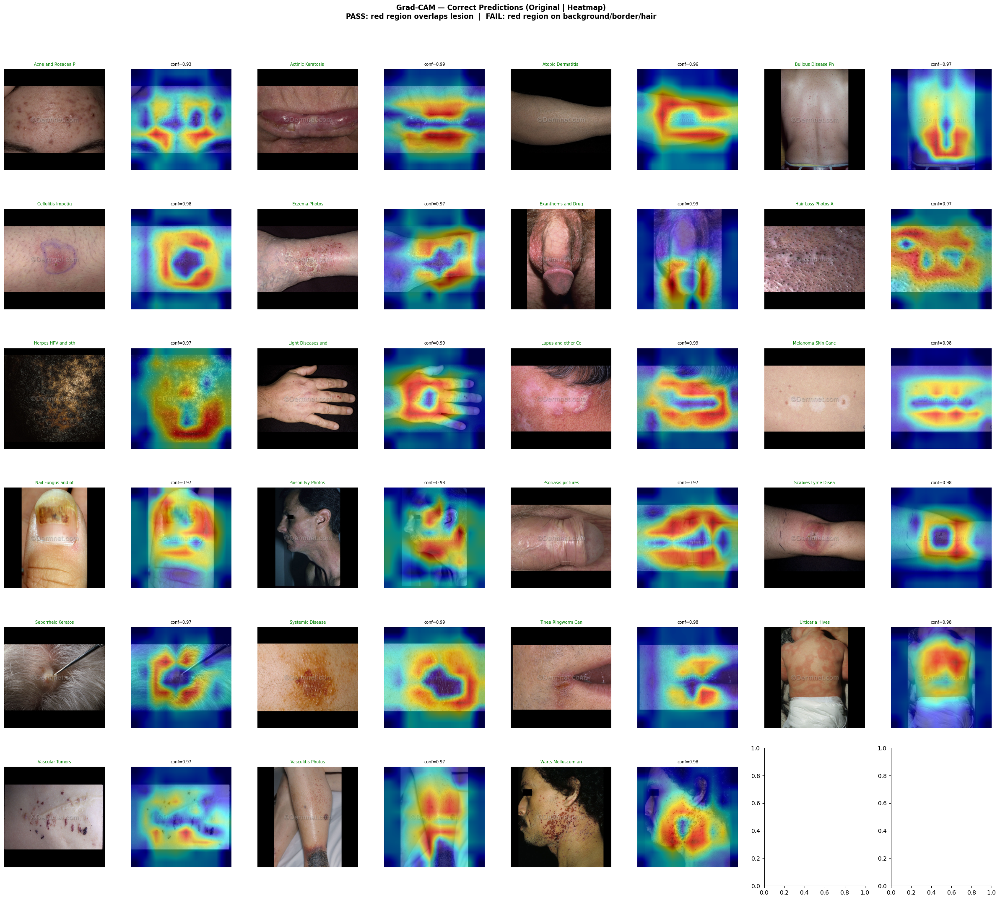

In [24]:
# Best correct prediction per class (highest confidence)
correct_samples = []
for cls_idx in range(NUM_CLASSES):
    mask = np.where(correct_mask & (all_labels == cls_idx))[0]
    if len(mask) == 0: continue
    correct_samples.append(mask[np.argsort(all_probs_max[mask])[::-1][0]])

n_cols = 4
n_rows = (len(correct_samples) + n_cols - 1) // n_cols
fig, axes = plt.subplots(n_rows, n_cols*2, figsize=(n_cols*6, n_rows*3.5))

for i, idx in enumerate(correct_samples):
    r, cp = divmod(i, n_cols)
    ax0 = axes[r, cp*2] if n_rows>1 else axes[cp*2]
    ax1 = axes[r, cp*2+1] if n_rows>1 else axes[cp*2+1]
    overlay, _, rgb = get_cam(all_paths[idx], int(all_labels[idx]))
    ax0.imshow(rgb); ax0.set_title(classes[all_labels[idx]][:18], fontsize=7, color='green'); ax0.axis('off')
    ax1.imshow(overlay); ax1.set_title(f'conf={all_probs_max[idx]:.2f}', fontsize=7); ax1.axis('off')

plt.suptitle('Grad-CAM — Correct Predictions (Original | Heatmap)\n'
             'PASS: red region overlaps lesion  |  FAIL: red region on background/border/hair',
             fontweight='bold', y=1.02)
plt.tight_layout()
plt.savefig(os.path.join(OUTPUT_DIR, 'gradcam_correct.png'), dpi=100, bbox_inches='tight')
plt.show()

---
## Section 25 · High-Confidence Errors Audit
*Where does the model look when it fails confidently? Distinguishes visual similarity errors from shortcut learning.*

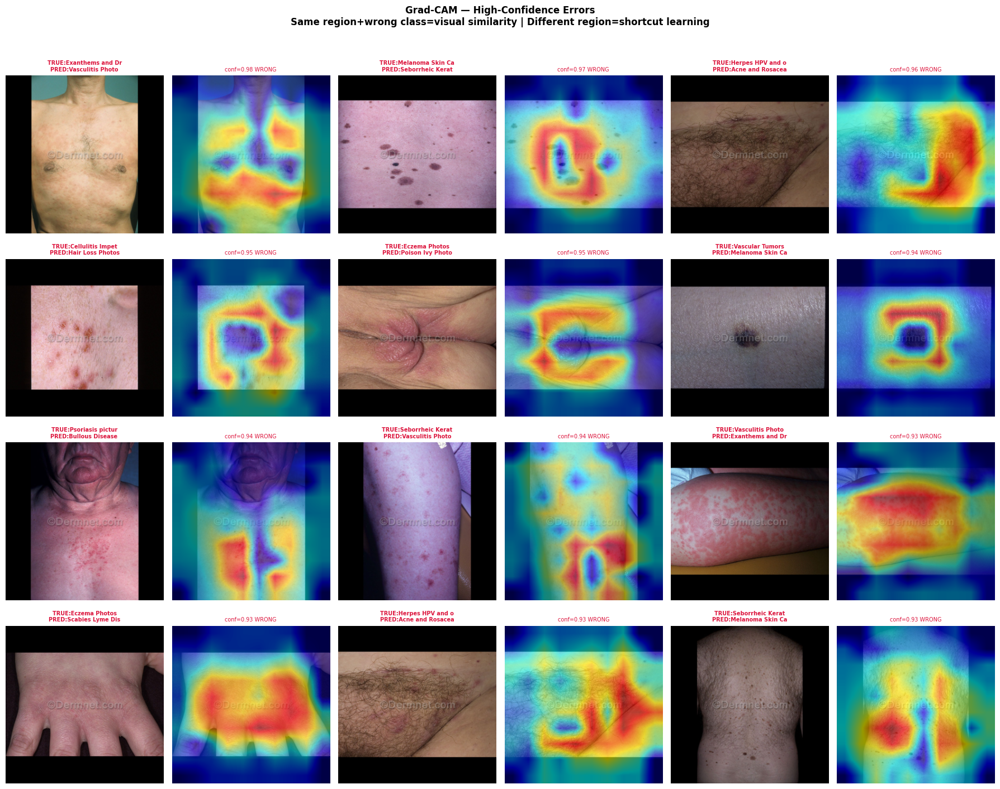

In [25]:
err_idx      = np.where(~correct_mask)[0]
hc_errors    = err_idx[np.argsort(all_probs_max[err_idx])[::-1]][:12]

n_cols = 3; n_rows = (len(hc_errors)+n_cols-1)//n_cols
fig, axes = plt.subplots(n_rows, n_cols*2, figsize=(n_cols*6, n_rows*3.5))

for i, idx in enumerate(hc_errors):
    r, cp = divmod(i, n_cols)
    ax0 = axes[r, cp*2] if n_rows>1 else axes[cp*2]
    ax1 = axes[r, cp*2+1] if n_rows>1 else axes[cp*2+1]
    overlay, _, rgb = get_cam(all_paths[idx], int(all_preds[idx]))
    tc = classes[all_labels[idx]][:16]; pc = classes[all_preds[idx]][:16]
    ax0.imshow(rgb); ax0.set_title(f'TRUE:{tc}\nPRED:{pc}', fontsize=7, color='crimson', fontweight='bold'); ax0.axis('off')
    ax1.imshow(overlay); ax1.set_title(f'conf={all_probs_max[idx]:.2f} WRONG', fontsize=7, color='crimson'); ax1.axis('off')

plt.suptitle('Grad-CAM — High-Confidence Errors\n'
             'Same region+wrong class=visual similarity | Different region=shortcut learning',
             fontweight='bold', y=1.02)
plt.tight_layout()
plt.savefig(os.path.join(OUTPUT_DIR, 'gradcam_errors.png'), dpi=100, bbox_inches='tight')
plt.show()

---
## Section 26 · Per-class Grad-CAM Gallery
*One representative example per condition: Original | True-class CAM | Predicted-class CAM.*

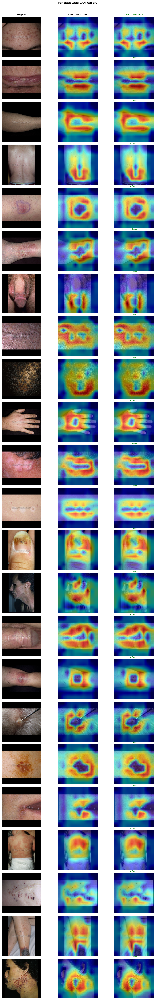

In [26]:
fig, axes = plt.subplots(NUM_CLASSES, 3, figsize=(12, NUM_CLASSES*2.8))

for ci in range(NUM_CLASSES):
    pool = np.where(correct_mask & (all_labels==ci))[0]
    if len(pool)==0: pool = np.where(all_labels==ci)[0]
    if len(pool)==0:
        for col in range(3): axes[ci,col].axis('off')
        continue
    idx = pool[np.argsort(all_probs_max[pool])[::-1][0]]

    _, _, rgb       = get_cam(all_paths[idx], ci)
    ov_true, _, _   = get_cam(all_paths[idx], ci)
    pred_ci         = int(all_preds[idx])
    ov_pred, _, _   = get_cam(all_paths[idx], pred_ci)
    pred_lbl        = '✓ Correct' if pred_ci==ci else classes[pred_ci][:16]
    pred_col        = 'green' if pred_ci==ci else 'crimson'

    axes[ci,0].imshow(rgb)
    axes[ci,0].set_ylabel(classes[ci][:22], rotation=0, labelpad=105, va='center', fontsize=7, fontweight='bold')
    axes[ci,0].axis('off')
    if ci==0: axes[ci,0].set_title('Original', fontsize=9, fontweight='bold')

    axes[ci,1].imshow(ov_true); axes[ci,1].axis('off')
    if ci==0: axes[ci,1].set_title('CAM — True Class', fontsize=9, fontweight='bold')

    axes[ci,2].imshow(ov_pred)
    axes[ci,2].set_title(pred_lbl, fontsize=7, color=pred_col)
    axes[ci,2].axis('off')
    if ci==0: axes[ci,2].set_title('CAM — Predicted', fontsize=9, fontweight='bold')

plt.suptitle('Per-class Grad-CAM Gallery', fontweight='bold', y=1.005)
plt.tight_layout(h_pad=0.2)
plt.savefig(os.path.join(OUTPUT_DIR, 'gradcam_gallery.png'), dpi=90, bbox_inches='tight')
plt.show()

---
## Section 27 · Centre Coverage Score
*Quantifies what fraction of Grad-CAM activation falls on the lesion centre vs the image periphery.*

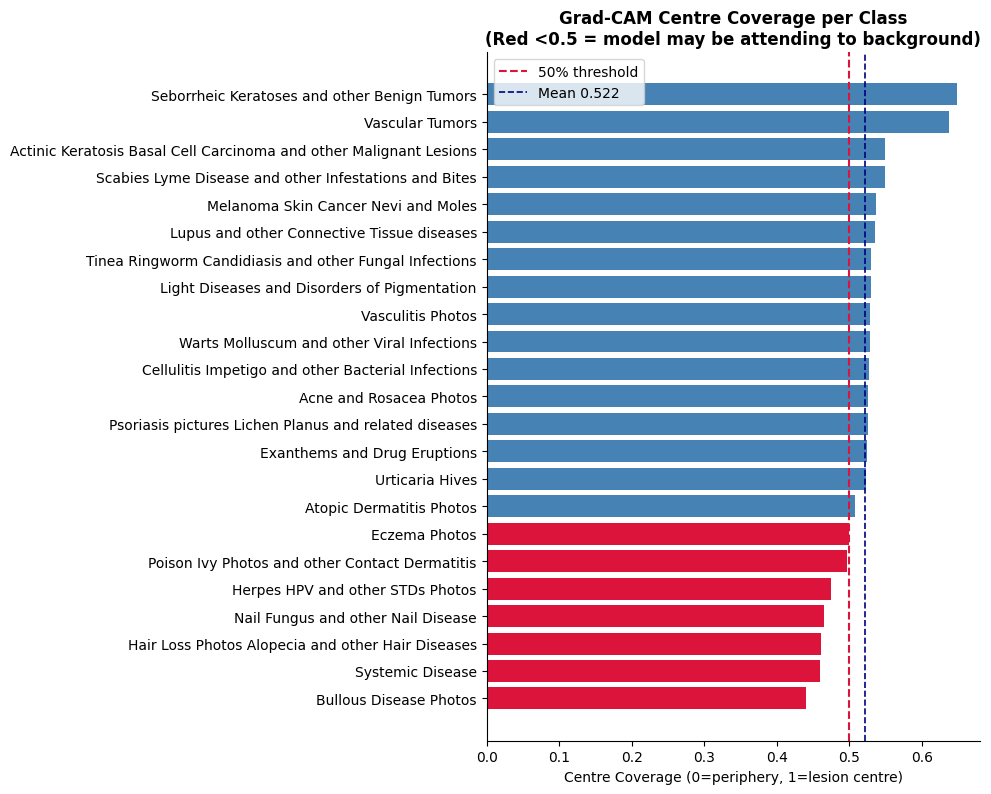

Mean coverage: 0.5217
Classes needing review: ['Bullous Disease Photos', 'Systemic Disease', 'Hair Loss Photos Alopecia and other Hair Diseases', 'Nail Fungus and other Nail Disease', 'Herpes HPV and other STDs Photos', 'Poison Ivy Photos and other Contact Dermatitis', 'Eczema Photos']


In [27]:
def centre_coverage(cam_map, frac=0.6):
    h, w = cam_map.shape
    mh, mw = int(h*(1-frac)/2), int(w*(1-frac)/2)
    return cam_map[mh:h-mh, mw:w-mw].sum() / (cam_map.sum() + 1e-8)

cov_rows = []
for ci in range(NUM_CLASSES):
    pool = np.where(correct_mask & (all_labels==ci))[0][:5]
    for idx in pool:
        _, cam_map, _ = get_cam(all_paths[idx], ci)
        cov_rows.append({'Class': classes[ci], 'Coverage': centre_coverage(cam_map)})

cov_df    = pd.DataFrame(cov_rows)
class_cov = cov_df.groupby('Class')['Coverage'].mean().sort_values()

fig, ax = plt.subplots(figsize=(10, max(5, NUM_CLASSES*0.35)))
colors  = ['crimson' if v<0.5 else 'steelblue' for v in class_cov.values]
ax.barh(class_cov.index, class_cov.values, color=colors)
ax.axvline(0.5,              color='crimson', ls='--', lw=1.5, label='50% threshold')
ax.axvline(class_cov.mean(), color='navy',   ls='--', lw=1.2, label=f'Mean {class_cov.mean():.3f}')
ax.set_xlabel('Centre Coverage (0=periphery, 1=lesion centre)')
ax.set_title('Grad-CAM Centre Coverage per Class\n(Red <0.5 = model may be attending to background)', fontweight='bold')
ax.legend(); plt.tight_layout()
plt.savefig(os.path.join(OUTPUT_DIR, 'gradcam_coverage.png'), dpi=120, bbox_inches='tight')
plt.show()

low_cov = class_cov[class_cov<0.5]
print(f'Mean coverage: {class_cov.mean():.4f}')
if len(low_cov): print(f'Classes needing review: {list(low_cov.index)}')
else: print('All classes: adequate centre coverage (>0.5).')

---
## Section 28 · Final Summary

In [29]:
macro_f1 = report_dict['macro avg']['f1-score']
macro_r  = report_dict['macro avg']['recall']
macro_p  = report_dict['macro avg']['precision']
wt_f1    = report_dict['weighted avg']['f1-score']
top3     = top_k_accuracy_score(all_labels, all_probs, k=3, labels=list(range(NUM_CLASSES)))
top5     = top_k_accuracy_score(all_labels, all_probs, k=5, labels=list(range(NUM_CLASSES)))

print('='*60)
print('  FINAL RESULTS — EfficientNetV2-S on DermNet')
print('='*60)
print(f'  Top-1 Accuracy     : {overall_acc:.4f}  ({overall_acc*100:.2f}%)')
print(f'  Top-3 Accuracy     : {top3:.4f}  ({top3*100:.2f}%)')
print(f'  Top-5 Accuracy     : {top5:.4f}  ({top5*100:.2f}%)')
print(f'  Macro Precision    : {macro_p:.4f}')
print(f'  Macro Recall       : {macro_r:.4f}')
print(f'  Macro F1 (primary) : {macro_f1:.4f}')
print(f'  Weighted F1        : {wt_f1:.4f}')
print(f'  Best class F1      : {metrics_df["F1"].max():.4f}  ({metrics_df.iloc[0]["Class"]})')
print(f'  Worst class F1     : {metrics_df["F1"].min():.4f}  ({metrics_df.iloc[-1]["Class"]})')
print(f'  CAM coverage (mean): {class_cov.mean():.4f}')
print(f'  CAM low-coverage   : {len(low_cov)} class(es) flagged')
print('='*60)
print(f'\n  Outputs saved to: {OUTPUT_DIR}')
print('  classification_report.txt')
print('  per_class_metrics.csv')
print('  confused_pairs.csv')
print('  training_curves_fold0.png')
print('  cm_raw.png  |  cm_normalised.png')
print('  per_class_accuracy.png')
print('  confidence_calibration.png')
print('  gradcam_correct.png')
print('  gradcam_errors.png')
print('  gradcam_gallery.png')
print('  gradcam_coverage.png')

  FINAL RESULTS — EfficientNetV2-S on DermNet
  Top-1 Accuracy     : 0.6489  (64.89%)
  Top-3 Accuracy     : 0.8287  (82.87%)
  Top-5 Accuracy     : 0.8789  (87.89%)
  Macro Precision    : 0.6135
  Macro Recall       : 0.6723
  Macro F1 (primary) : 0.6322
  Weighted F1        : 0.6492
  Best class F1      : 0.9129  (Nail Fungus and other Nail Disease)
  Worst class F1     : 0.4776  (Acne and Rosacea Photos)
  CAM coverage (mean): 0.5217
  CAM low-coverage   : 7 class(es) flagged

  Outputs saved to: /kaggle/working/outputs
  classification_report.txt
  per_class_metrics.csv
  confused_pairs.csv
  training_curves_fold0.png
  cm_raw.png  |  cm_normalised.png
  per_class_accuracy.png
  confidence_calibration.png
  gradcam_correct.png
  gradcam_errors.png
  gradcam_gallery.png
  gradcam_coverage.png
